In [1]:
import numpy as np
from scipy import linalg
from scipy.spatial.transform import Rotation as R
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib.collections
import matplotlib.patches
import pg_fitter_tools as fit
import sk_geo_tools as geo
import cv2
import re
from collections import Counter

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
#%matplotlib notebook
%load_ext autoreload
%autoreload 2

In [4]:
focal_length = np.array([2.760529621789217e+03, 2.767014510543478e+03])
principle_point = np.array([1.914303537872458e+03, 1.596386868474348e+03])
radial_distortion = np.array([-0.2398, 0.1145])
tangential_distortion = [0, 0]
camera_matrix = fit.build_camera_matrix(focal_length, principle_point)
distortion = fit.build_distortion_array(radial_distortion, tangential_distortion)

In [5]:
camera_r = 1100.
camera_z = 0.
n_cameras = 50
camera_phis = np.array([np.pi*i*2./n_cameras for i in range(n_cameras)])
camera_positions = np.column_stack((
    camera_r*np.sin(camera_phis),
    camera_r*np.cos(camera_phis),
    np.repeat(0, n_cameras)))
camera_directions = np.column_stack((
    np.sin(camera_phis),
    np.cos(camera_phis),
    np.repeat(0., n_cameras)))
camera_rolls = np.repeat(0., n_cameras)
camera_rotations, camera_translations = fit.camera_poses(camera_positions, camera_directions, camera_rolls, 2)

In [6]:
pmt_locations = fit.read_3d_feature_locations("parameters/SK_all_PMT_locations.txt", delimiter="\t")
# pmt_locations = fit.read_3d_feature_locations("parameters/SK_simtest_PMT_locations.txt", delimiter=" ")
bolt_count = 24
bolt_locations = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = {k: np.mean([bolt_locations[re.sub(r"-00$", "-" + str(i + 1).zfill(2), k)] for i in range(0, 24, 24//bolt_count)], axis=0)
                           for k in pmt_locations.keys()}

In [7]:
def setup_bolt_simulation(feature_positions, image_feature_locations, focal_length, principle_point, radial_distortion, seed_error=1):
    seed_feature_positions = {}
    for i, f in feature_positions.items():
        seed_feature_positions[i] = np.random.normal(f, seed_error)
    fitter = fit.PhotogrammetryFitter(image_feature_locations, seed_feature_positions, focal_length, principle_point, radial_distortion)
    return fitter

In [8]:
def run_bolt_fit(fitter, bolt_positions, xtol=1e-5):
    reco_cam_rotations, reco_cam_translations, reprojected_points = fitter.estimate_camera_poses()
    reco_cam_rotations, reco_cam_translations, reco_locations = fitter.bundle_adjustment(reco_cam_rotations, reco_cam_translations, xtol=xtol)
    
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_locations)
    print("mean reconstruction error:", linalg.norm(reco_errors, axis=1).mean())
    print("max reconstruction error:", linalg.norm(reco_errors, axis=1).max())

    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(reco_cam_rotations, reco_cam_translations)
    cam_orientations_transformed = np.matmul(R, reco_cam_orientations)
    cam_positions_translated = reco_cam_positions - translation
    cam_positions_transformed = scale*R.dot(cam_positions_translated.transpose()).transpose()

    reco_bolt_positions = reco_positions_dict(reco_transformed, fitter.feature_index)
    position_errors = linalg.norm(reco_errors, axis=1)

    return reco_bolt_positions, position_errors

In [9]:
def reco_positions_dict(reco_positions, feature_index):
    return {f: reco_positions[i] for f, i in feature_index.items()}

In [10]:
def get_full_ring_pmts(bolt_keys, pmt_keys, bolt_count):
    return [p for p in pmt_keys if all(re.sub(r"-00$", "-" + str(i + 1).zfill(2), p) in bolt_keys for i in range(0, 24, 24//bolt_count))]

In [11]:
def get_ring_positions(bolt_positions, pmt_keys, bolt_count):
    return {k: np.mean([bolt_positions[re.sub(r"-00$", "-" + str(i + 1).zfill(2), k)] for i in range(0, 24, 24//bolt_count)], axis=0)
                           for k in pmt_keys}

In [12]:
def get_ring_orientations(bolt_positions, pmt_keys, bolt_count):
    ring_orientations = {}
    for k in pmt_keys:
        c, n = geo.fit_plane(np.array([bolt_positions[re.sub(r"-00$", "-" + str(b + 1).zfill(2), k)] for b in range(0, 24, 24//bolt_count)]))
        # flip normal if it is directed away from tank centre
        if np.dot(n,c) > 0:
            n = -n
        ring_orientations[k] = n
    return ring_orientations

In [13]:
def get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count):
    full_ring_pmts = get_full_ring_pmts(reco_bolt_positions.keys(), ring_positions.keys(), bolt_count)
    reco_ring_positions = get_ring_positions(reco_bolt_positions, full_ring_pmts, bolt_count)
    errors = np.array([linalg.norm(reco_ring_positions[k] - ring_positions[k]) for k in full_ring_pmts])
    return errors

In [14]:
def get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count):
    full_ring_pmts = get_full_ring_pmts(reco_bolt_positions.keys(), ring_positions.keys(), bolt_count)
    reco_orientations = get_ring_orientations(reco_bolt_positions, full_ring_pmts, bolt_count)
    errors = np.array([np.degrees(np.arccos(np.dot(reco_orientations[k], ring_orientations[k]))) for k in full_ring_pmts])
    return errors

In [15]:
def make_fig(title, xlabel, figsize=(8,6)):
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    fig.tight_layout()
    return fig, ax

In [16]:
def set_axes_equal(ax):
    '''Make axes of 3D plot have equal scale so that spheres appear as spheres,
    cubes as cubes, etc..  This is one possible solution to Matplotlib's
    ax.set_aspect('equal') and ax.axis('equal') not working for 3D.

    Input
      ax: a matplotlib axis, e.g., as output from plt.gca().
    '''

    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()

    x_range = abs(x_limits[1] - x_limits[0])
    x_middle = np.mean(x_limits)
    y_range = abs(y_limits[1] - y_limits[0])
    y_middle = np.mean(y_limits)
    z_range = abs(z_limits[1] - z_limits[0])
    z_middle = np.mean(z_limits)

    # The plot bounding box is a sphere in the sense of the infinity
    # norm, hence I call half the max range the plot radius.
    plot_radius = 0.5*max([x_range, y_range, z_range])

    ax.set_xlim3d([x_middle - plot_radius, x_middle + plot_radius])
    ax.set_ylim3d([y_middle - plot_radius, y_middle + plot_radius])
    ax.set_zlim3d([z_middle - plot_radius, z_middle + plot_radius])

In [17]:
def plot_reconstruction(reco_positions, cam_positions):
    fig = plt.figure(figsize=(12,9))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(reco_positions[:,0], reco_positions[:,1], reco_positions[:,2], marker='^', label="Bolt", s=1)
    ax.scatter(cam_positions[:,0], cam_positions[:,1], cam_positions[:,2], marker='*', label="Camera", s=60)
    set_axes_equal(ax)
    plt.legend(loc=0)
    fig.tight_layout()

In [18]:
def plot_geometry(bolt_positions, pmt_positions, cam_positions):
    fig = plt.figure(figsize=(12,9))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter([b[0] for b in bolt_positions.values()], [b[1] for b in bolt_positions.values()], [b[2] for b in bolt_positions.values()], marker='.', label="Bolt", s=1)
    ax.scatter([p[0] for p in pmt_positions.values()], [p[1] for p in pmt_positions.values()], [p[2] for p in pmt_positions.values()], marker='o', label="PMT", s=20)
    ax.scatter(cam_positions[:,0], cam_positions[:,1], cam_positions[:,2], marker='^', label="Camera", s=60)
    ax.set_xlabel("x [cm]")
    ax.set_ylabel("y [cm]")
    ax.set_zlabel("z [cm]")
    plt.legend(loc=0)
    fig.tight_layout()

In [19]:
bolt_counts = [3, 4, 6, 8, 12, 24]
bolt_position_errors = {b: {} for b in bolt_counts}
ring_position_errors = {b: {} for b in bolt_counts}
ring_orientation_errors = {b: {} for b in bolt_counts}

# Simulation with 3 bolts

Feature in image counts: Counter({4: 3989, 5: 361})


/home/prouse/work/PhotogrammetryAnalysis/pg_fitter_tools.py:200: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


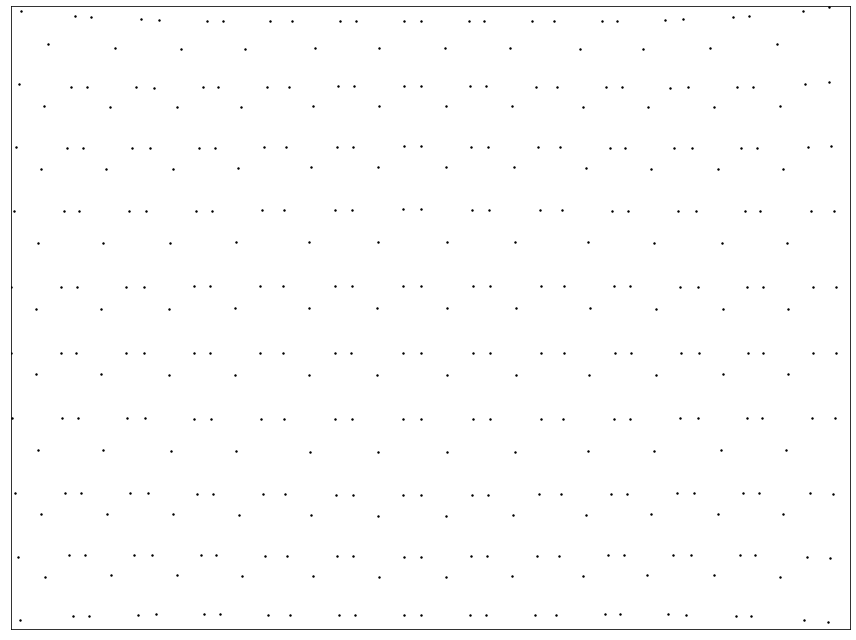

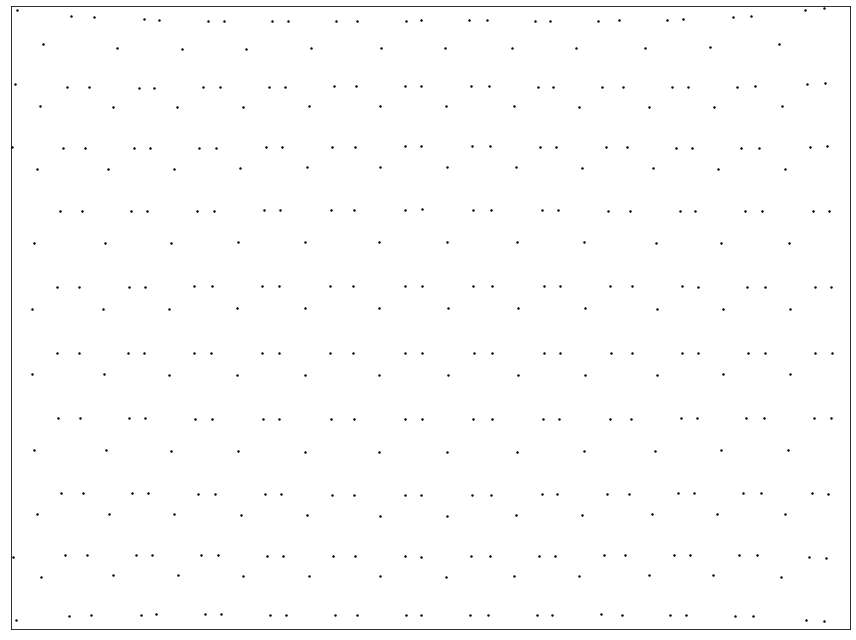

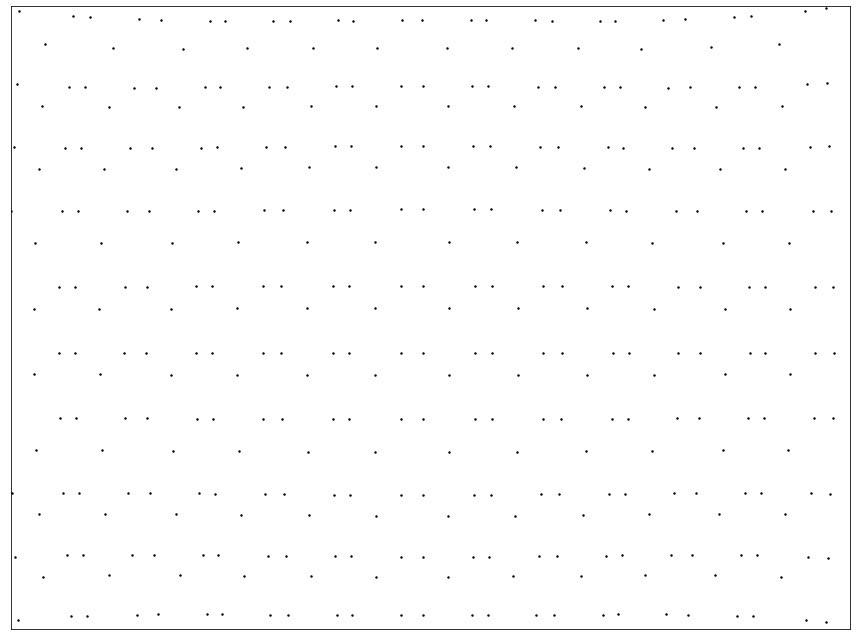

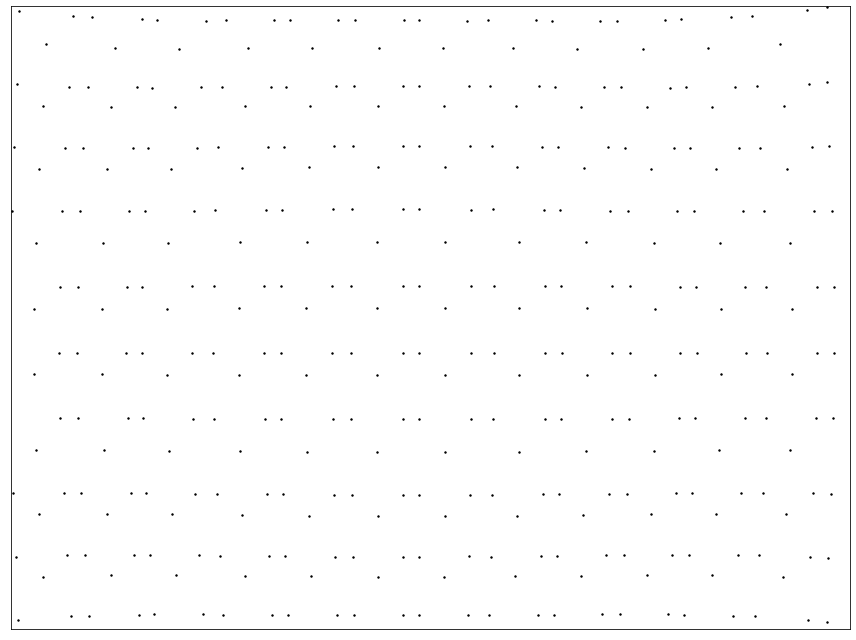

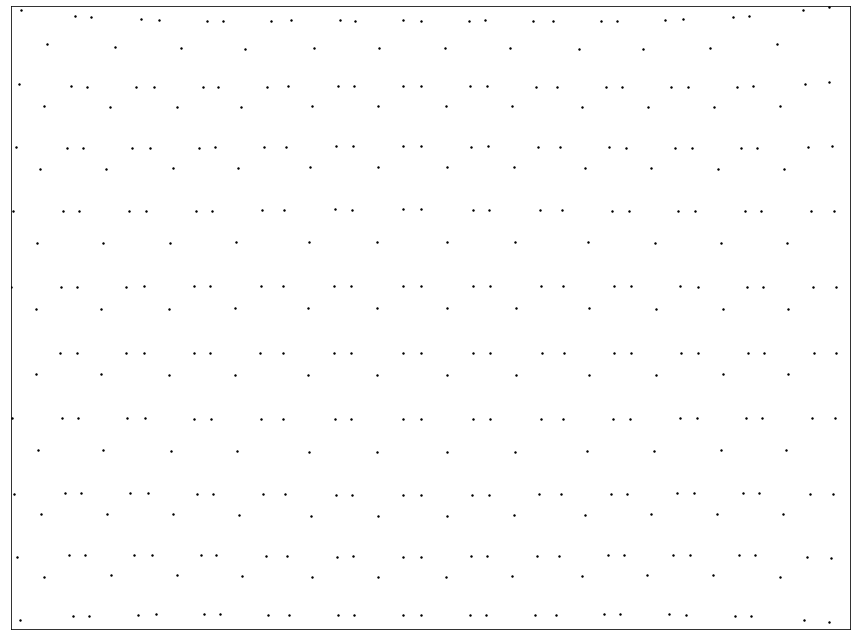

...

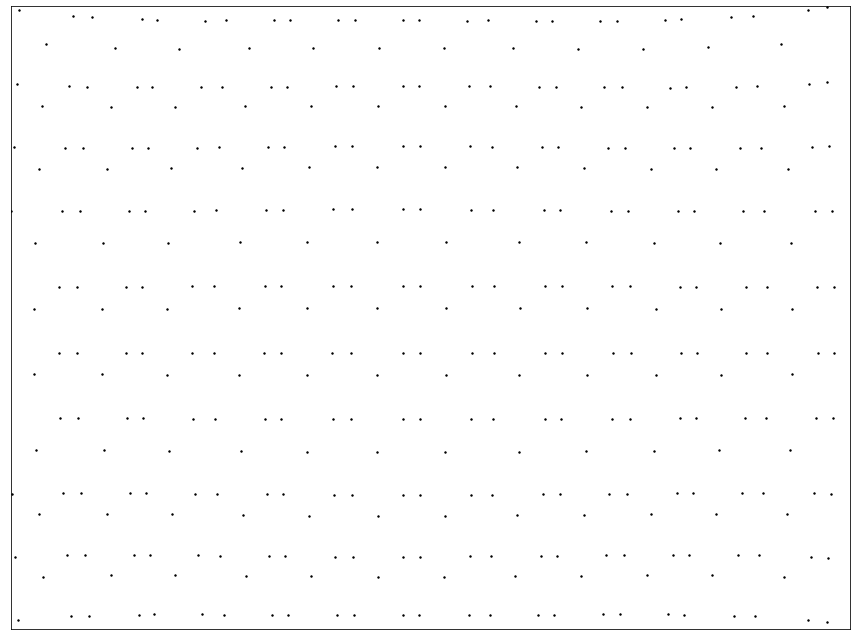

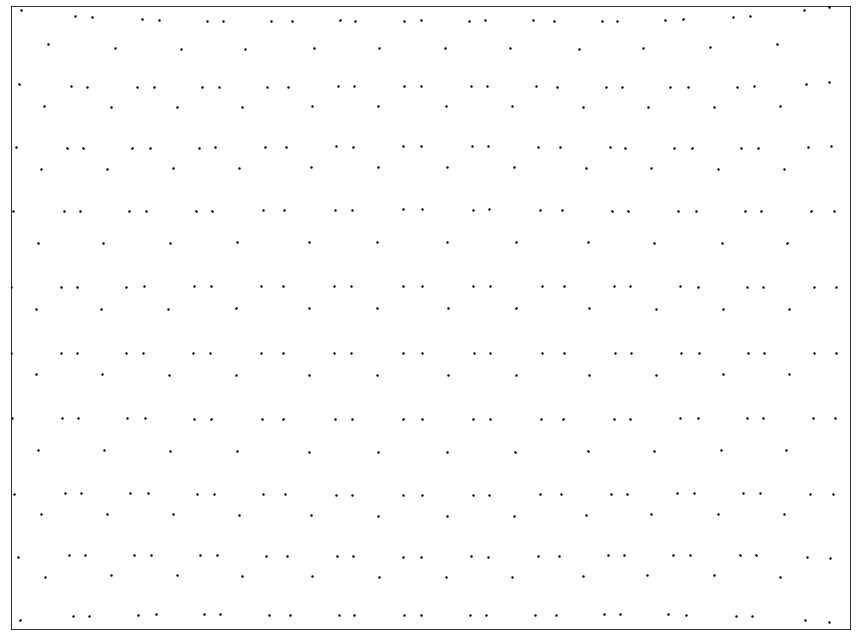

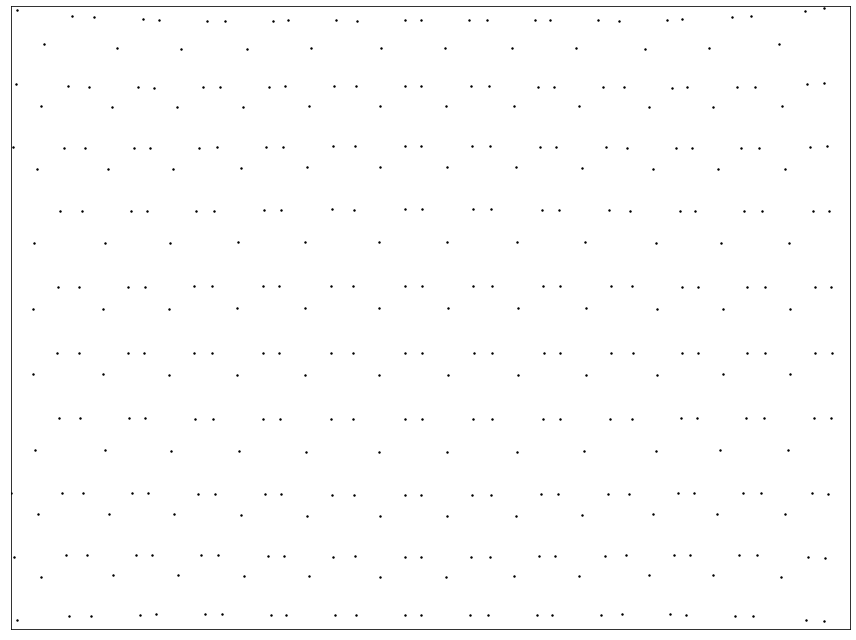

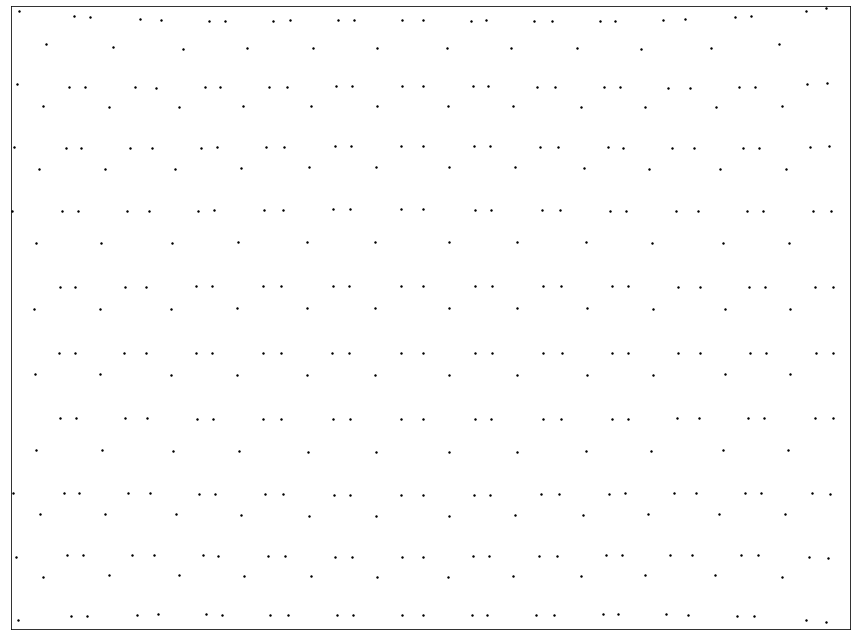

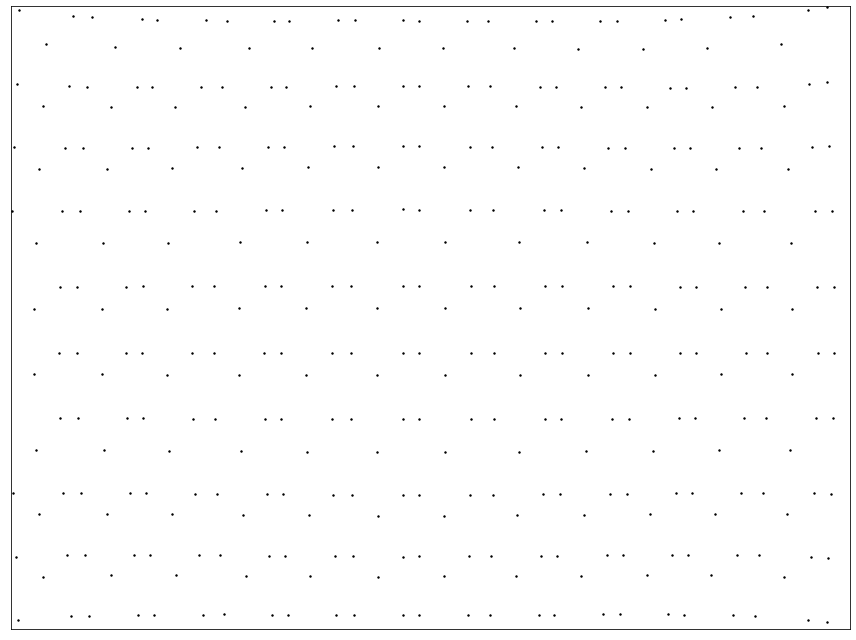

In [20]:
bolt_count = 3
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

=== Gaussian errors on feature image locations: 0.5 ===
Feature in image counts: Counter({2: 1950})
50 images with total of  1950 features
image 0 reprojection errors:    average: 5.639614518053343    max: 14.002307607975474
image 1 reprojection errors:    average: 8.106800804055561    max: 18.963092296126685
image 2 reprojection errors:    average: 7.323380302719074    max: 15.683497970103836
image 3 reprojection errors:    average: 5.549726709563651    max: 14.093497498953251
image 4 reprojection errors:    average: 7.135113011288998    max: 18.197937864785303
image 5 reprojection errors:    average: 7.1606577569487495    max: 19.06333072751856
image 6 reprojection errors:    average: 7.088949951193072    max: 18.99403852149633
image 7 reprojection errors:    average: 6.148450186648764    max: 13.403851124300159
image 8 reprojection errors:    average: 6.19225491108551    max: 13.495726760735096
image 9 reprojection errors:    average: 6.451498055776866    max: 15.828045840739376
ima

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         9.8315e+04                                    1.50e+06    
       1              2         4.1426e+03      9.42e+04       6.72e+01       1.16e+04    
       2              3         2.4128e+03      1.73e+03       5.32e+01       2.70e+04    
       3              4         2.0404e+03      3.72e+02       8.50e+00       1.28e+03    
       4              5         1.9382e+03      1.02e+02       4.75e+00       4.30e+02    
       5              6         1.8756e+03      6.26e+01       3.02e+00       1.89e+02    
       6              7         1.8426e+03      3.30e+01       1.82e+00       2.18e+02    
       7              8         1.8313e+03      1.13e+01       4.82e-01       1.01e+02    
`xtol` termination condition is satisfied.
Function evaluations 8, initial cost 9.8315e+04, final cost 1.8313e+03, first-order optimality 1.01e+02.
mean reprojection error: 0.796416

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         1.3114e+05                                    1.66e+06    
       1              2         1.5266e+04      1.16e+05       7.62e+01       1.76e+04    
       2              3         8.2355e+03      7.03e+03       1.17e+02       6.51e+04    
       3              4         7.3549e+03      8.81e+02       1.27e+01       3.26e+03    
       4              5         7.1539e+03      2.01e+02       5.21e+00       7.59e+02    
       5              6         7.1052e+03      4.87e+01       1.32e+00       3.00e+02    
       6              7         7.0771e+03      2.80e+01       7.89e-01       2.30e+02    
       7              8         7.0522e+03      2.49e+01       9.89e-01       2.84e+02    
       8              9         7.0292e+03      2.30e+01       7.19e-01       2.87e+02    
`xtol` termination condition is satisfied.
Function evaluations 9, initial cost 1.3114e+05

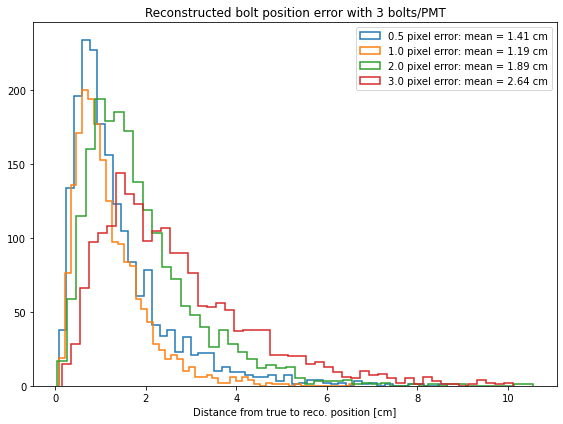

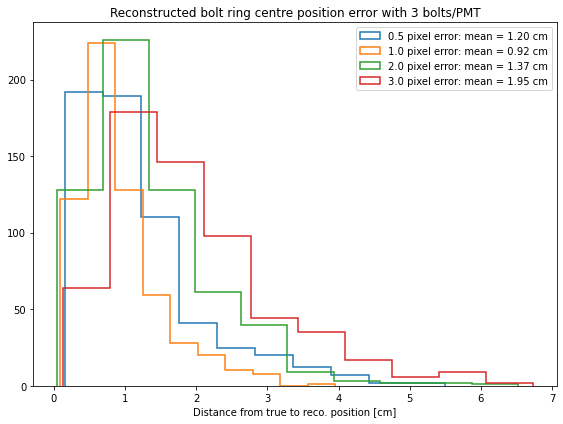

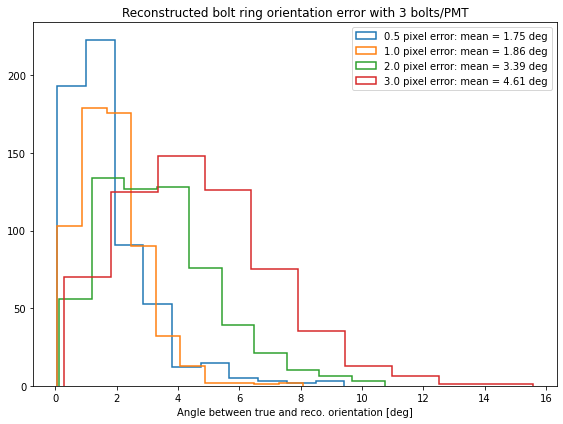

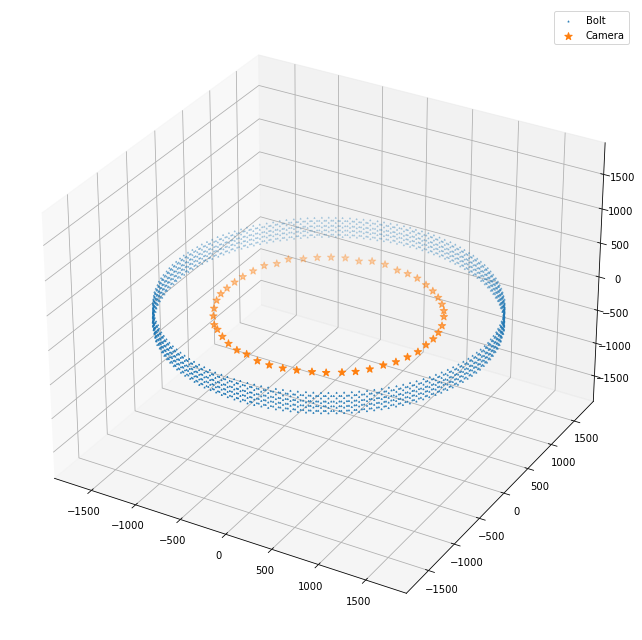

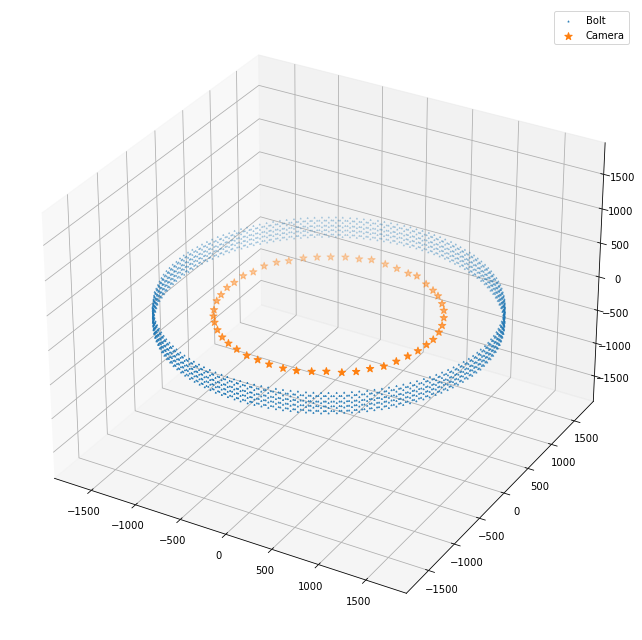

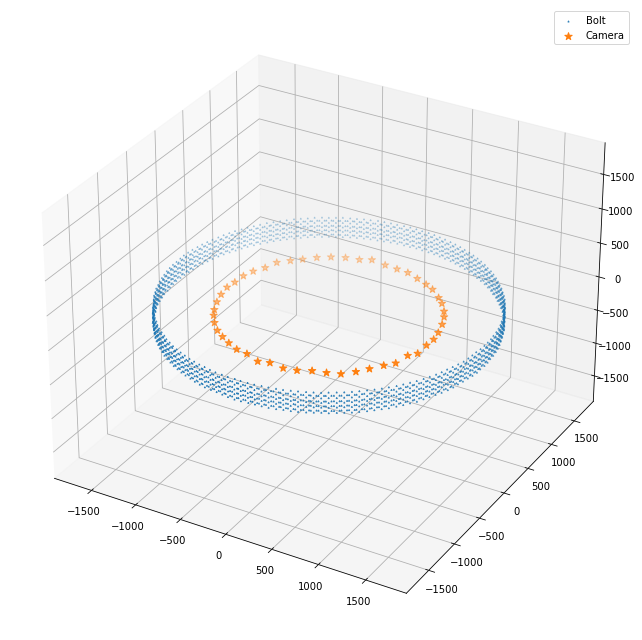

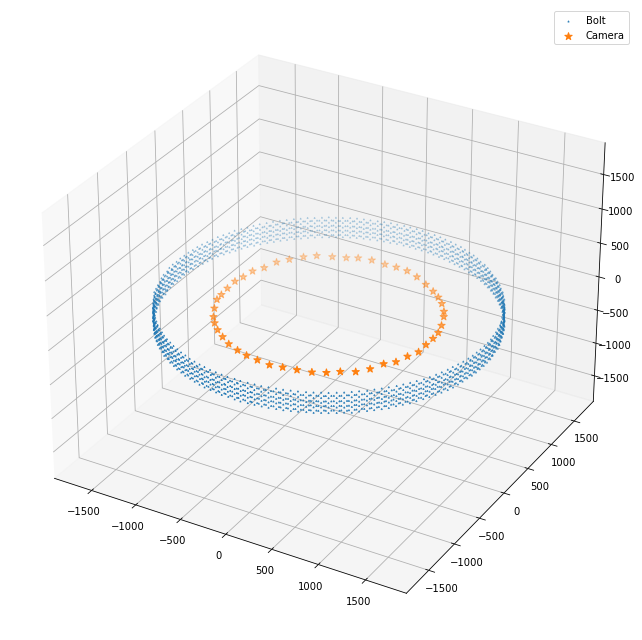

In [21]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
    bolt_position_errors[bolt_count][pixel_error] = position_errors.mean()
    ring_position_errors[bolt_count][pixel_error] = centre_errors.mean()
    ring_orientation_errors[bolt_count][pixel_error] = orientation_errors.mean()
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')

(array([  8.,  26.,  83., 244., 496., 561., 345., 145.,  34.,   8.]),
 array([1664.73579665, 1666.74941166, 1668.76302666, 1670.77664167,
        1672.79025667, 1674.80387167, 1676.81748668, 1678.83110168,
        1680.84471668, 1682.85833169, 1684.87194669]),
 <BarContainer object of 10 artists>)

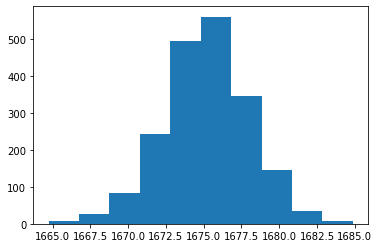

In [28]:
plt.hist(np.linalg.norm(reco_transformed[:,:2], axis=1))

In [30]:
fitter.

# Simulation with 4 bolts

In [ ]:
bolt_count = 4
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

In [ ]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
    bolt_position_errors[bolt_count][pixel_error] = position_errors.mean()
    ring_position_errors[bolt_count][pixel_error] = centre_errors.mean()
    ring_orientation_errors[bolt_count][pixel_error] = orientation_errors.mean()
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')

# Simulation with 6 bolts

In [ ]:
bolt_count = 6
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

In [ ]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
    bolt_position_errors[bolt_count][pixel_error] = position_errors.mean()
    ring_position_errors[bolt_count][pixel_error] = centre_errors.mean()
    ring_orientation_errors[bolt_count][pixel_error] = orientation_errors.mean()
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')

# Simulation with 8 bolts

In [ ]:
bolt_count = 8
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

In [ ]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
    bolt_position_errors[bolt_count][pixel_error] = position_errors.mean()
    ring_position_errors[bolt_count][pixel_error] = centre_errors.mean()
    ring_orientation_errors[bolt_count][pixel_error] = orientation_errors.mean()
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')

# Simulation with 12 bolts

In [ ]:
bolt_count = 12
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

In [ ]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
    bolt_position_errors[bolt_count][pixel_error] = position_errors.mean()
    ring_position_errors[bolt_count][pixel_error] = centre_errors.mean()
    ring_orientation_errors[bolt_count][pixel_error] = orientation_errors.mean()
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')

# Simulation with 24 bolts

Feature in image counts: Counter({18: 65073, 17: 23679, 22: 18806, 21: 11978, 16: 5180, 14: 4506, 15: 4318, 13: 3994, 12: 3972, 23: 3355, 11: 3272, 10: 3026, 7: 2324, 9: 2312, 6: 2132, 8: 1790, 5: 1690, 3: 972, 2: 848, 4: 802, 20: 211})


/home/prouse/work/PhotogrammetryAnalysis/pg_fitter_tools.py:197: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


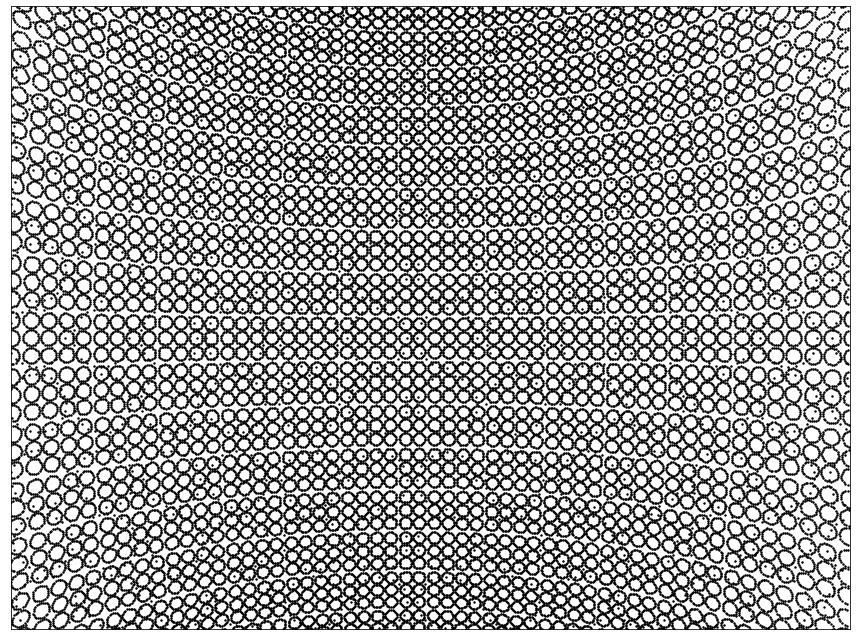

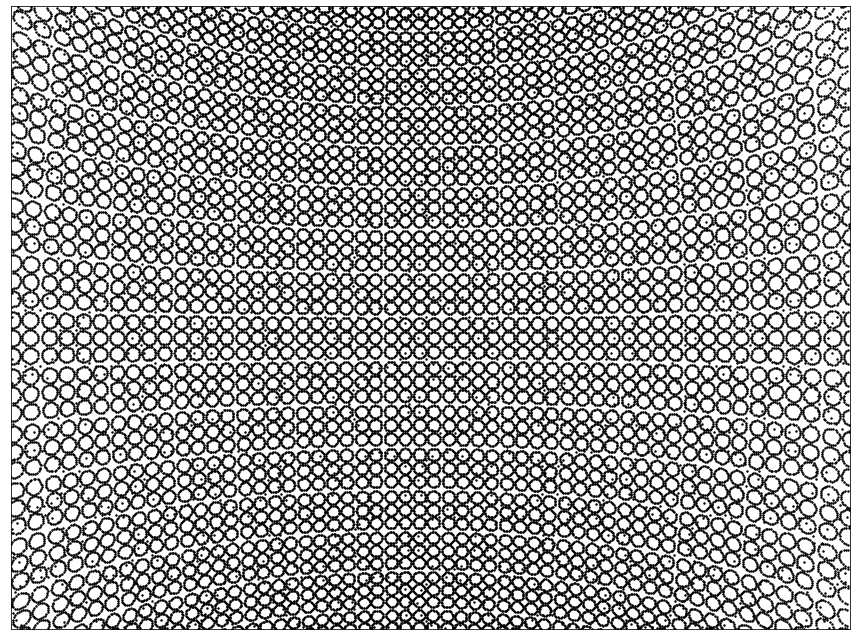

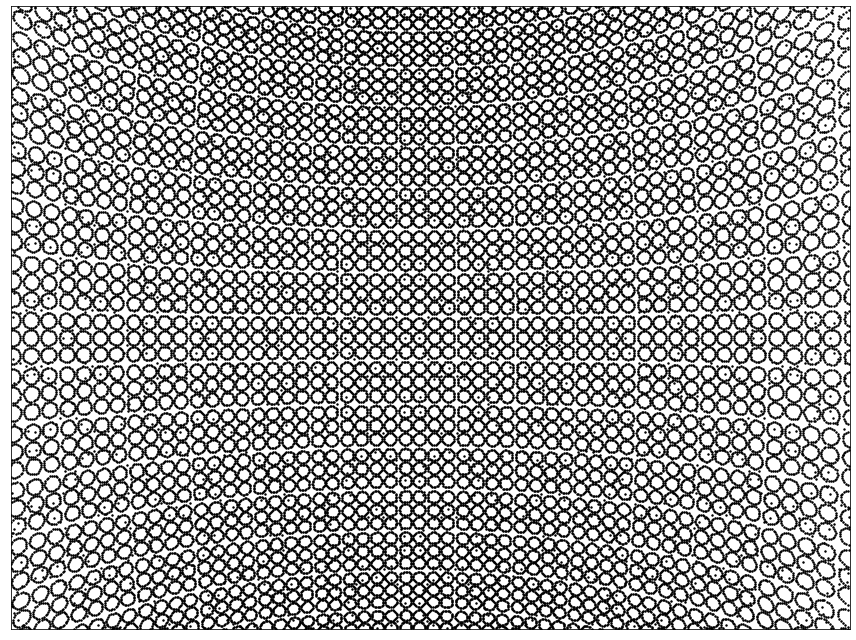

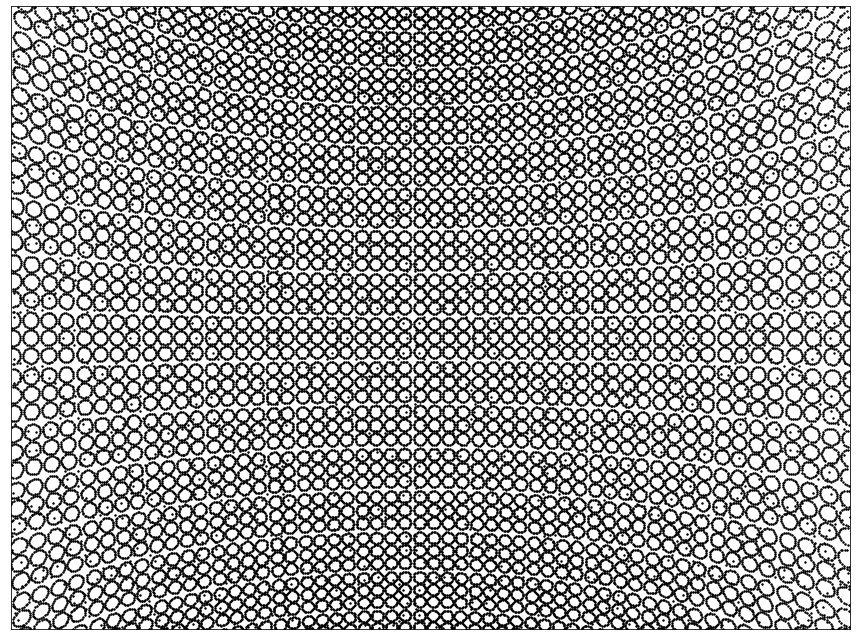

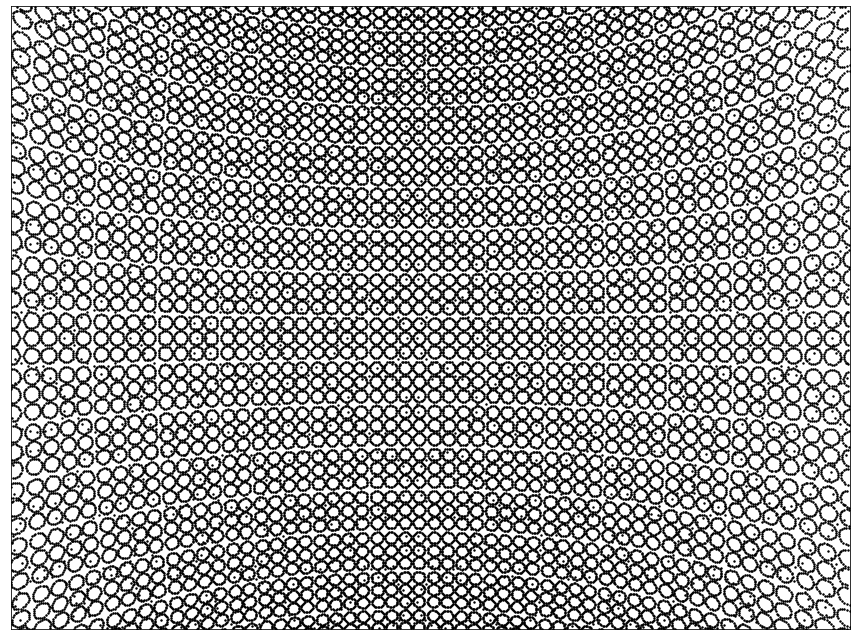

...

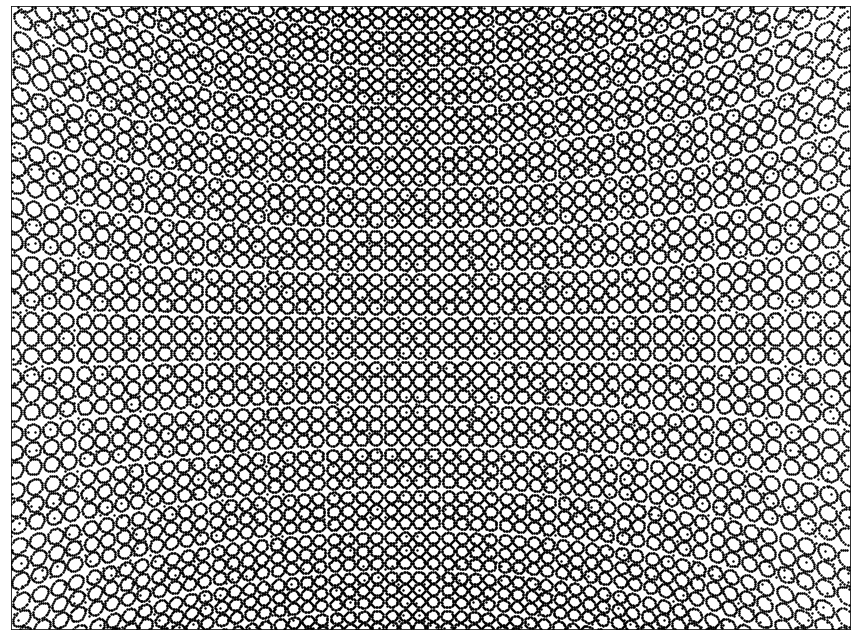

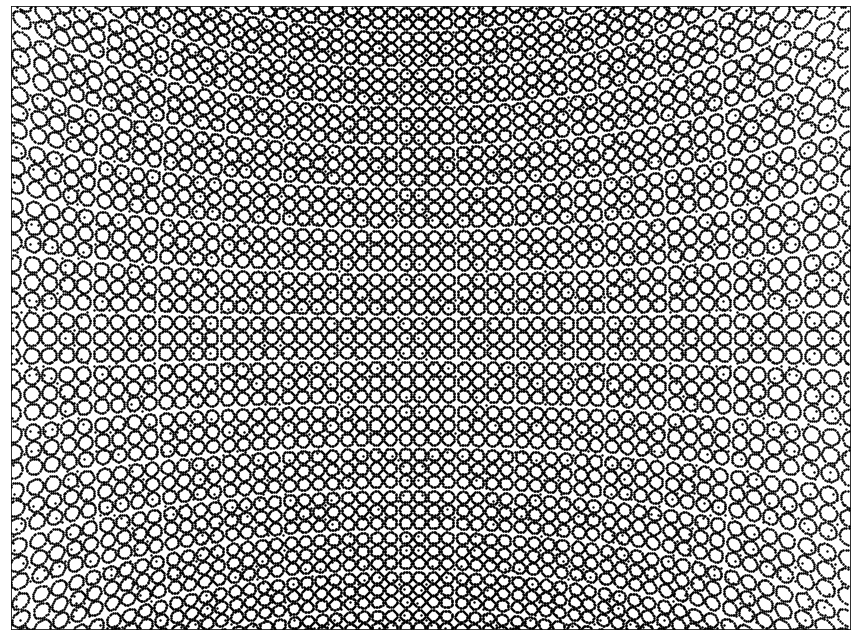

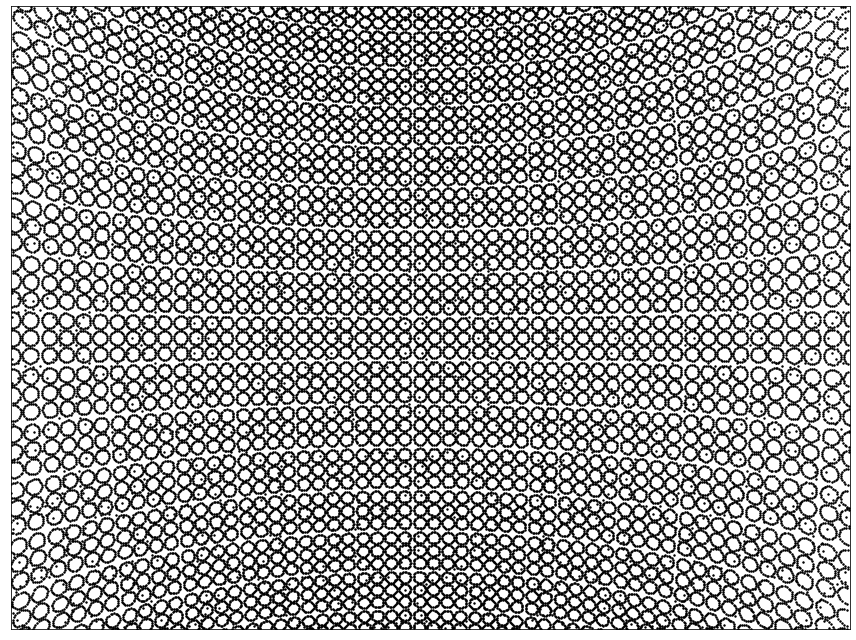

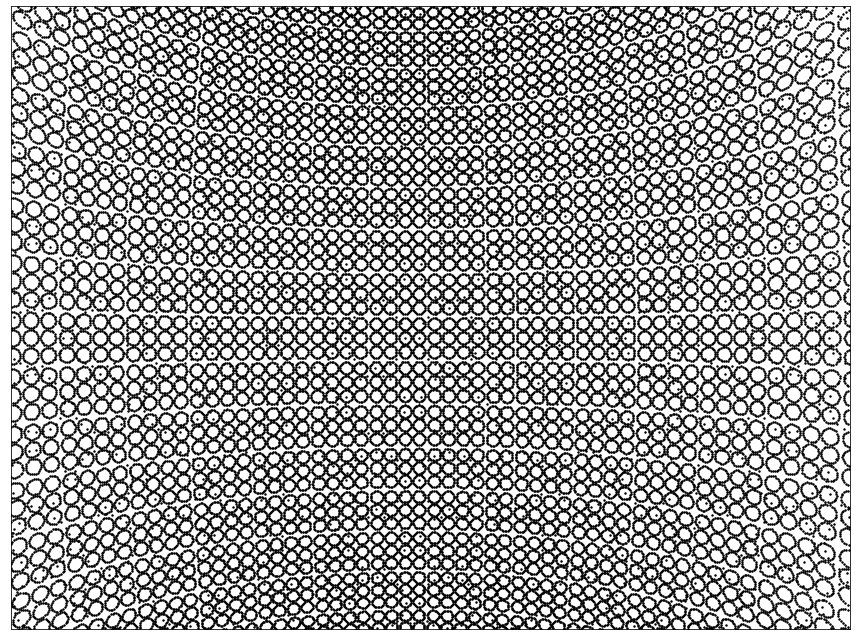

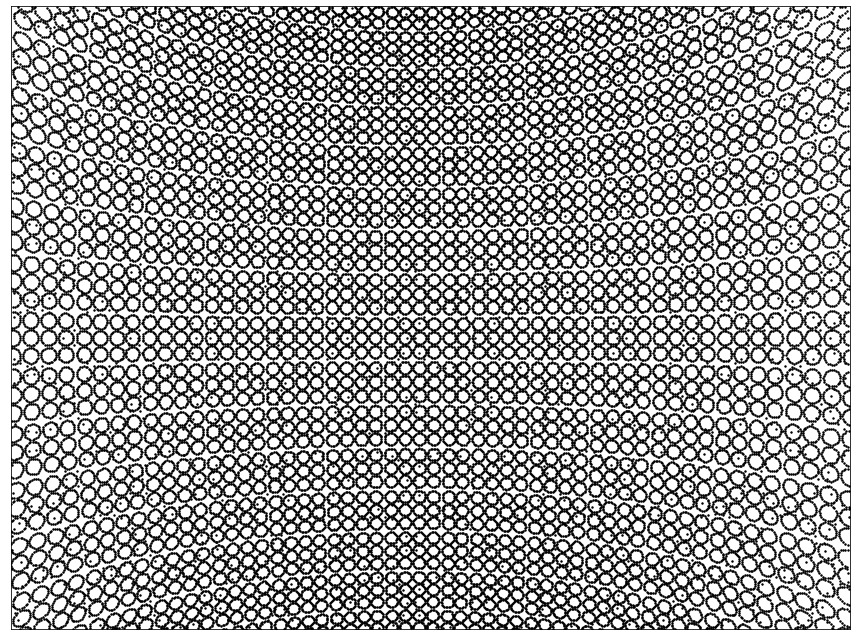

In [20]:
bolt_count = 24
bolt_positions = geo.get_bolt_locations_barrel(pmt_locations, bolt_count)
ring_positions = get_ring_positions(bolt_positions, pmt_locations.keys(), bolt_count)
ring_orientations = get_ring_orientations(bolt_positions, pmt_locations.keys(), bolt_count)
simulator = fit.PhotogrammetrySimulator(bolt_positions, focal_length, principle_point, camera_rotations, camera_translations, radial_distortion, tangential_distortion)
image_feature_locations = simulator.get_image_feature_locations(area_restrict = [[0, 4000], [0, 3000]], min_feature_count = 2)
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
print("Feature in image counts:", Counter(feature_counts.values()))
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]])

In [ ]:
fig_bolt_pos, ax_bolt_pos = make_fig("Reconstructed bolt position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_pos, ax_ring_pos = make_fig("Reconstructed bolt ring centre position error with {} bolts/PMT".format(bolt_count), "Distance from true to reco. position [cm]")
fig_ring_ang, ax_ring_ang = make_fig("Reconstructed bolt ring orientation error with {} bolts/PMT".format(bolt_count), "Angle between true and reco. orientation [deg]")
for pixel_error in [0.5, 1.0, 2.0, 3.0]:
    print("=== Gaussian errors on feature image locations:", pixel_error, "===")
    smeared_feature_locations = simulator.get_image_feature_locations(area_restrict=[[1000, 3000], [750, 2250]], min_feature_count=2, pixel_error=pixel_error)
    feature_counts = Counter([f for i in smeared_feature_locations.values() for f in i.keys()])
    print("Feature in image counts:", Counter(feature_counts.values()))
    bolt_positions2 = {k: v for k, v in bolt_positions.items() if np.any([k in i.keys() for i in smeared_feature_locations.values()])}
    fitter = setup_bolt_simulation(bolt_positions2, smeared_feature_locations, focal_length, principle_point, radial_distortion)    
    reco_bolt_positions, position_errors = run_bolt_fit(fitter, bolt_positions2, xtol=1e-5)
    centre_errors = get_ring_centre_errors(reco_bolt_positions, ring_positions, bolt_count)
    orientation_errors = get_ring_orientation_errors(reco_bolt_positions, ring_orientations, bolt_count)
    ax_bolt_pos.hist(position_errors, bins=50, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, position_errors.mean()))
    ax_ring_pos.hist(centre_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} cm".format(pixel_error, centre_errors.mean()))
    ax_ring_ang.hist(orientation_errors, bins=10, histtype='step', lw=1.5, label="{} pixel error: mean = {:.2f} deg".format(pixel_error, orientation_errors.mean()))
    reco_errors, reco_transformed, scale, R, translation, _ = fit.kabsch_errors(bolt_positions, reco_bolt_positions)
    reco_cam_orientations, reco_cam_positions = fit.camera_world_poses(fitter.camera_rotations, fitter.camera_translations)
    plot_reconstruction(reco_transformed, reco_cam_positions)
    bolt_position_errors[bolt_count][pixel_error] = position_errors.mean()
    ring_position_errors[bolt_count][pixel_error] = centre_errors.mean()
    ring_orientation_errors[bolt_count][pixel_error] = orientation_errors.mean()
ax_bolt_pos.legend(loc='upper right')
ax_ring_pos.legend(loc='upper right')
ax_ring_ang.legend(loc='upper right')

In [ ]:
import re

In [ ]:
print("bolt_pos")
print([float(re.sub(r".* ([0-9.]+) cm", r"\1", a.get_text())) for a in ax_bolt_pos.legend().get_texts()])
print("ring_pos")
print([float(re.sub(r".* ([0-9.]+) cm", r"\1", a.get_text())) for a in ax_ring_pos.legend().get_texts()])
print("ring_ang")
print([float(re.sub(r".* ([0-9.]+) deg", r"\1", a.get_text())) for a in ax_ring_ang.legend().get_texts()])

In [ ]:
simulator.show_images(image_feature_locations, area=[[0,4000],[0,3000]], inner_area=[[1000, 3000], [750, 2250]], image_set=[1])

In [ ]:
true_transformed = reco_transformed-reco_errors
reco_r = np.sqrt(reco_transformed[:,0]**2+reco_transformed[:,1]**2)
true_r = np.sqrt(true_transformed[:,0]**2+true_transformed[:,1]**2)
reco_z = reco_transformed[:,2]
true_z = true_transformed[:,2]
errors_r = reco_r-true_r
errors_z = reco_z-true_z

In [ ]:
errors_r

In [ ]:
errors_z

In [ ]:
fig_bolt_rpos, ax_bolt_rpos = make_fig("Reconstructed bolt position error in radial direction".format(bolt_count), "Distance from true to reco. position [cm]")
fig_bolt_zpos, ax_bolt_zpos = make_fig("Reconstructed bolt position error in vertical direction".format(bolt_count), "Distance from true to reco. position [cm]")
ax_bolt_rpos.hist(errors_r, bins=50, histtype='step', lw=1.5)
ax_bolt_zpos.hist(errors_z, bins=50, histtype='step', lw=1.5)


In [ ]:
bolt_count